![](https://github.com/VascoCapao/images/blob/main/Exploring%20the%20Supermarket.gif?raw=true)

In [43]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio


# Import custom functions
from AA_functions import *

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Add parent directory to sys.path
import sys
sys.path.insert(0, '..')

# Data Exploration and Cleaning

In [44]:
# Import Customer Info dataset
cust_info = pd.read_csv('customer_info.csv')

# Display the dataset
cust_info

,Unnamed: 0,customer_id,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude
0,0,39634,David Frink,male,05/15/1964 10:34 PM,1.0,1.0,1.0,2.0,18306.0,7106.0,17.0,484.0,604.0,943.0,2226.0,4056.0,2174.0,3946.0,2514.0,32.0,0.072206,2010.0,NaN,38.735637,-9.149071
1,1,43460,Belinda Terry,female,03/26/1988 11:06 PM,1.0,0.0,1.0,2.0,5015.0,1334.0,8.0,344.0,374.0,1217.0,1068.0,1925.0,2115.0,1028.0,1987.0,2566.0,0.206227,2014.0,NaN,38.762702,-9.160802
2,2,23937,Evelyn Calico,female,04/13/1969 06:07 PM,0.0,1.0,1.0,3.0,3097.0,4073.0,10.0,301.0,852.0,1731.0,446.0,2347.0,1306.0,1504.0,2018.0,1282.0,0.136168,2009.0,951127.0,38.717431,-9.165105
3,3,2431,Ora Boggess,female,06/15/1941 03:26 AM,0.0,0.0,0.0,1.0,10825.0,207.0,17.0,153.0,252.0,60.0,285.0,151.0,53.0,0.0,4135.0,70.0,0.215852,2007.0,958680.0,38.782169,-9.150318
4,4,10090,Lonnie Hopson,male,12/18/2001 03:03 AM,0.0,0.0,0.0,1.0,697.0,570.0,NaN,8.0,33.0,2833.0,54.0,172.0,587.0,223.0,64.0,4.0,0.181023,2024.0,977059.0,38.770397,-9.177024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43626,43626,48487,Amelia Crawford,female,08/28/1983 11:43 AM,1.0,1.0,0.0,1.0,7189.0,6293.0,17.0,678.0,741.0,639.0,1569.0,3779.0,1748.0,4387.0,2812.0,14.0,0.233259,2016.0,NaN,38.760694,-9.166146
43627,43627,24856,Silvia Ramos,female,09/21/1992 07:16 PM,1.0,1.0,1.0,1.0,11238.0,11490.0,12.0,602.0,557.0,1503.0,2610.0,3893.0,1621.0,3831.0,2726.0,25.0,0.060977,2014.0,909859.0,38.760280,-9.166643
43628,43628,21373,Addie Coronel,female,02/20/1994 05:58 AM,0.0,0.0,0.0,1.0,6059.0,241.0,12.0,289.0,420.0,43.0,331.0,142.0,179.0,0.0,11242.0,44.0,0.097672,2017.0,NaN,38.769923,-9.181550
43629,43629,19527,Msc. Mary Ross,female,08/06/1989 04:39 PM,1.0,0.0,1.0,1.0,3098.0,425.0,6.0,866.0,369.0,222.0,1.0,0.0,393.0,210.0,422.0,178.0,0.182188,2007.0,933102.0,38.760889,-9.174663


In [45]:
# Display the column names of the cust_info DataFrame
cust_info.columns

Index(['Unnamed: 0', 'customer_id', 'customer_name', 'customer_gender',
       'customer_birthdate', 'kids_home', 'teens_home', 'number_complaints',
       'distinct_stores_visited', 'lifetime_spend_groceries',
       'lifetime_spend_electronics', 'typical_hour',
       'lifetime_spend_vegetables', 'lifetime_spend_nonalcohol_drinks',
       'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat',
       'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames', 'lifetime_spend_petfood',
       'lifetime_total_distinct_products',
       'percentage_of_products_bought_promotion', 'year_first_transaction',
       'loyalty_card_number', 'latitude', 'longitude'],
      dtype='object')

In [46]:
# Remove the 'Unnamed: 0' column from the cust_info DataFrame
cust_info.drop(['Unnamed: 0'], axis=1, inplace=True)

In [47]:
# Identify and store duplicated rows based on 'customer_id' column in the cust_info DataFrame
duplicates = cust_info[cust_info.duplicated(subset='customer_id', keep=False)]

# Display the duplicated rows
duplicates

,customer_id,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude


In [48]:
# Set the 'customer_id' column as the index of the cust_info DataFrame
cust_info.set_index('customer_id', inplace=True)

In [49]:
# Create a copy of the cust_info DataFrame and assign it to the variable customer_info
customer_info = cust_info.copy()

# Display the first few rows of the customer_info DataFrame
customer_info.head()

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude
customer_id,,,,,,,,,,,,,,,,,,,,,,,,
39634,David Frink,male,05/15/1964 10:34 PM,1.0,1.0,1.0,2.0,18306.0,7106.0,17.0,484.0,604.0,943.0,2226.0,4056.0,2174.0,3946.0,2514.0,32.0,0.072206,2010.0,NaN,38.735637,-9.149071
43460,Belinda Terry,female,03/26/1988 11:06 PM,1.0,0.0,1.0,2.0,5015.0,1334.0,8.0,344.0,374.0,1217.0,1068.0,1925.0,2115.0,1028.0,1987.0,2566.0,0.206227,2014.0,NaN,38.762702,-9.160802
23937,Evelyn Calico,female,04/13/1969 06:07 PM,0.0,1.0,1.0,3.0,3097.0,4073.0,10.0,301.0,852.0,1731.0,446.0,2347.0,1306.0,1504.0,2018.0,1282.0,0.136168,2009.0,951127.0,38.717431,-9.165105
2431,Ora Boggess,female,06/15/1941 03:26 AM,0.0,0.0,0.0,1.0,10825.0,207.0,17.0,153.0,252.0,60.0,285.0,151.0,53.0,0.0,4135.0,70.0,0.215852,2007.0,958680.0,38.782169,-9.150318
10090,Lonnie Hopson,male,12/18/2001 03:03 AM,0.0,0.0,0.0,1.0,697.0,570.0,NaN,8.0,33.0,2833.0,54.0,172.0,587.0,223.0,64.0,4.0,0.181023,2024.0,977059.0,38.770397,-9.177024


In [50]:
# Generate a summary of the dataframe informations
dataframe_summary(customer_info)

-------------------------------------------------------------------------------------------------------------------------------------------------
SHAPE of Dataset -----------------------------------------------------------------------------------------------------------------------
(43631, 24)
-------------------------------------------------------------------------------------------------------------------------------------------------
DATA TYPES of Dataset ------------------------------------------------------------------------------------------------------------------
customer_name                               object
customer_gender                             object
customer_birthdate                          object
kids_home                                  float64
teens_home                                 float64
number_complaints                          float64
distinct_stores_visited                    float64
lifetime_spend_groceries                   float64
lifetime_spend

## Handle missing values

### Removing rows with more than 1 missing value

In [51]:
# Select relevant columns from the customer_info DataFrame
relevant_columns = ['kids_home', 'teens_home', 'number_complaints', 
                    'distinct_stores_visited', 'typical_hour', 
                    'lifetime_spend_vegetables', 'lifetime_spend_fish']

customer_info_subset = customer_info[relevant_columns]

In [52]:
# Count the number of missing values in each row
# axis=1 specifies that we are counting along the columns
customer_info['missing_count'] = customer_info_subset.isnull().sum(axis=1)

In [53]:
# Identify rows with more than one missing value
rows_with_missing_values = customer_info[customer_info['missing_count'] > 1]

In [54]:
# Remove rows with more than one missing value
customer_info_precleaned = customer_info.drop(rows_with_missing_values.index)

In [55]:
# Remove the 'missing_count' column
customer_info_precleaned = customer_info_precleaned.drop(columns=['missing_count'])

In [56]:
customer_info_precleaned.isnull().sum()

customer_name                                  0
customer_gender                                0
customer_birthdate                             0
kids_home                                    451
teens_home                                   906
number_complaints                            555
distinct_stores_visited                     1139
lifetime_spend_groceries                       0
lifetime_spend_electronics                     0
typical_hour                                1541
lifetime_spend_vegetables                    758
lifetime_spend_nonalcohol_drinks               0
lifetime_spend_alcohol_drinks                  0
lifetime_spend_meat                            0
lifetime_spend_fish                         1146
lifetime_spend_hygiene                         0
lifetime_spend_videogames                      0
lifetime_spend_petfood                         0
lifetime_total_distinct_products               0
percentage_of_products_bought_promotion        0
year_first_transacti

### Handle the remaining missing values using KNN imputer, except for the loyalty_card_number column

In [57]:
# Initialize the KNN Imputer
imputer = KNNImputer(n_neighbors=5)

# Apply the KNN Imputer to the numeric columns
customer_info_precleaned[relevant_columns] = imputer.fit_transform(customer_info_precleaned[relevant_columns])

In [58]:
# Check for missing values in the customer_info_precleaned DataFrame After Imputation
customer_info_precleaned.isnull().sum()

customer_name                                  0
customer_gender                                0
customer_birthdate                             0
kids_home                                      0
teens_home                                     0
number_complaints                              0
distinct_stores_visited                        0
lifetime_spend_groceries                       0
lifetime_spend_electronics                     0
typical_hour                                   0
lifetime_spend_vegetables                      0
lifetime_spend_nonalcohol_drinks               0
lifetime_spend_alcohol_drinks                  0
lifetime_spend_meat                            0
lifetime_spend_fish                            0
lifetime_spend_hygiene                         0
lifetime_spend_videogames                      0
lifetime_spend_petfood                         0
lifetime_total_distinct_products               0
percentage_of_products_bought_promotion        0
year_first_transacti

## Feature Engineering

In [59]:
# Feature 1: Customer Age
customer_info_precleaned['customer_birthdate'] = pd.to_datetime(customer_info_precleaned['customer_birthdate'], format = '%m/%d/%Y %I:%M %p')
customer_info_precleaned.rename(columns = {'customer_birthdate': 'customer_age'}, inplace = True)
customer_info_precleaned['customer_age'] = datetime.now().year - customer_info_precleaned['customer_age'].dt.year

In [60]:
# Feature 2: Total Lifetime Spend
spend_cols = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_fish', 'lifetime_spend_vegetables','lifetime_spend_nonalcohol_drinks',
              'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat', 'lifetime_spend_hygiene', 'lifetime_spend_videogames', 'lifetime_spend_petfood']

customer_info_precleaned['total_lifetime_spend'] = customer_info_precleaned[spend_cols].sum(axis=1)

In [61]:
# Feature 3: Percentage Spend by Category
for col in spend_cols:
    customer_info_precleaned[f'percentage_{col}'] = customer_info_precleaned[col] / customer_info_precleaned['total_lifetime_spend']

In [62]:
# Feature 4: Average Spend per Store Visited
customer_info_precleaned['avg_spend_per_store'] = customer_info_precleaned['total_lifetime_spend'] / customer_info_precleaned['distinct_stores_visited']

In [63]:
# Feature 5: Loyalty Duration
customer_info_precleaned['loyalty_years'] = 2024 - customer_info_precleaned['year_first_transaction']

In [64]:
# Create Binary Variables
# Convert customer gender to binary indicator variable
customer_info_precleaned['customer_gender'] = customer_info_precleaned['customer_gender'].apply(lambda x: 1 if x == 'male' else 0)

# Convert loyalty card number to binary indicator variable for whether customer has a loyalty card
customer_info_precleaned['loyalty_card_number'] = customer_info_precleaned['loyalty_card_number'].fillna(0).apply(lambda x: 1 if x != 0 else 0)

In [65]:
# Set option to display all columns
pd.set_option('display.max_columns', None)

# Display the first 5 rows of the customer_info_precleaned DataFrame
customer_info_precleaned.head(5)

,customer_name,customer_gender,customer_age,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude,total_lifetime_spend,percentage_lifetime_spend_groceries,percentage_lifetime_spend_electronics,percentage_lifetime_spend_fish,percentage_lifetime_spend_vegetables,percentage_lifetime_spend_nonalcohol_drinks,percentage_lifetime_spend_alcohol_drinks,percentage_lifetime_spend_meat,percentage_lifetime_spend_hygiene,percentage_lifetime_spend_videogames,percentage_lifetime_spend_petfood,avg_spend_per_store,loyalty_years
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
39634,David Frink,1,60,1.0,1.0,1.0,2.0,18306.0,7106.0,17.0,484.0,604.0,943.0,2226.0,4056.0,2174.0,3946.0,2514.0,32.0,0.072206,2010.0,0,38.735637,-9.149071,42359.0,0.432163,0.167757,0.095753,0.011426,0.014259,0.022262,0.052551,0.051323,0.093156,0.059350,21179.500000,14.0
43460,Belinda Terry,0,36,1.0,0.0,1.0,2.0,5015.0,1334.0,8.0,344.0,374.0,1217.0,1068.0,1925.0,2115.0,1028.0,1987.0,2566.0,0.206227,2014.0,0,38.762702,-9.160802,16407.0,0.305662,0.081307,0.117328,0.020967,0.022795,0.074176,0.065094,0.128908,0.062656,0.121107,8203.500000,10.0
23937,Evelyn Calico,0,55,0.0,1.0,1.0,3.0,3097.0,4073.0,10.0,301.0,852.0,1731.0,446.0,2347.0,1306.0,1504.0,2018.0,1282.0,0.136168,2009.0,1,38.717431,-9.165105,17675.0,0.175219,0.230438,0.132786,0.017030,0.048204,0.097935,0.025233,0.073890,0.085092,0.114173,5891.666667,15.0
2431,Ora Boggess,0,83,0.0,0.0,0.0,1.0,10825.0,207.0,17.0,153.0,252.0,60.0,285.0,151.0,53.0,0.0,4135.0,70.0,0.215852,2007.0,1,38.782169,-9.150318,16121.0,0.671484,0.012840,0.009367,0.009491,0.015632,0.003722,0.017679,0.003288,0.000000,0.256498,16121.000000,17.0
10090,Lonnie Hopson,1,23,0.0,0.0,0.0,1.0,697.0,570.0,14.8,8.0,33.0,2833.0,54.0,172.0,587.0,223.0,64.0,4.0,0.181023,2024.0,1,38.770397,-9.177024,5241.0,0.132990,0.108758,0.032818,0.001526,0.006297,0.540546,0.010303,0.112002,0.042549,0.012211,5241.000000,0.0


In [66]:
# Apply the 'map_degree' function to create a new 'degree' column based on 'customer_name'
customer_info_precleaned['degree'] = customer_info_precleaned['customer_name'].apply(map_degree)

# Apply the 'remove_degree' function to remove the degree from 'customer_name' and update the column
customer_info_precleaned['customer_name'] = customer_info_precleaned['customer_name'].apply(remove_degree)

In [67]:
customer_info_precleaned

,customer_name,customer_gender,customer_age,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude,total_lifetime_spend,percentage_lifetime_spend_groceries,percentage_lifetime_spend_electronics,percentage_lifetime_spend_fish,percentage_lifetime_spend_vegetables,percentage_lifetime_spend_nonalcohol_drinks,percentage_lifetime_spend_alcohol_drinks,percentage_lifetime_spend_meat,percentage_lifetime_spend_hygiene,percentage_lifetime_spend_videogames,percentage_lifetime_spend_petfood,avg_spend_per_store,loyalty_years,degree
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
39634,David Frink,1,60,1.0,1.0,1.0,2.0,18306.0,7106.0,17.0,484.0,604.0,943.0,2226.0,4056.0,2174.0,3946.0,2514.0,32.0,0.072206,2010.0,0,38.735637,-9.149071,42359.0,0.432163,0.167757,0.095753,0.011426,0.014259,0.022262,0.052551,0.051323,0.093156,0.059350,21179.500000,14.0,0
43460,Belinda Terry,0,36,1.0,0.0,1.0,2.0,5015.0,1334.0,8.0,344.0,374.0,1217.0,1068.0,1925.0,2115.0,1028.0,1987.0,2566.0,0.206227,2014.0,0,38.762702,-9.160802,16407.0,0.305662,0.081307,0.117328,0.020967,0.022795,0.074176,0.065094,0.128908,0.062656,0.121107,8203.500000,10.0,0
23937,Evelyn Calico,0,55,0.0,1.0,1.0,3.0,3097.0,4073.0,10.0,301.0,852.0,1731.0,446.0,2347.0,1306.0,1504.0,2018.0,1282.0,0.136168,2009.0,1,38.717431,-9.165105,17675.0,0.175219,0.230438,0.132786,0.017030,0.048204,0.097935,0.025233,0.073890,0.085092,0.114173,5891.666667,15.0,0
2431,Ora Boggess,0,83,0.0,0.0,0.0,1.0,10825.0,207.0,17.0,153.0,252.0,60.0,285.0,151.0,53.0,0.0,4135.0,70.0,0.215852,2007.0,1,38.782169,-9.150318,16121.0,0.671484,0.012840,0.009367,0.009491,0.015632,0.003722,0.017679,0.003288,0.000000,0.256498,16121.000000,17.0,0
10090,Lonnie Hopson,1,23,0.0,0.0,0.0,1.0,697.0,570.0,14.8,8.0,33.0,2833.0,54.0,172.0,587.0,223.0,64.0,4.0,0.181023,2024.0,1,38.770397,-9.177024,5241.0,0.132990,0.108758,0.032818,0.001526,0.006297,0.540546,0.010303,0.112002,0.042549,0.012211,5241.000000,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48487,Amelia Crawford,0,41,1.0,1.0,0.0,1.0,7189.0,6293.0,17.0,678.0,741.0,639.0,1569.0,3779.0,1748.0,4387.0,2812.0,14.0,0.233259,2016.0,0,38.760694,-9.166146,29835.0,0.240959,0.210927,0.126663,0.022725,0.024837,0.021418,0.052589,0.058589,0.147042,0.094252,29835.000000,8.0,0
24856,Silvia Ramos,0,32,1.0,1.0,1.0,1.0,11238.0,11490.0,12.0,602.0,557.0,1503.0,2610.0,3893.0,1621.0,3831.0,2726.0,25.0,0.060977,2014.0,1,38.760280,-9.166643,40071.0,0.280452,0.286741,0.097153,0.015023,0.013900,0.037508,0.065134,0.040453,0.095605,0.068029,40071.000000,10.0,0
21373,Addie Coronel,0,30,0.0,0.0,0.0,1.0,6059.0,241.0,12.0,289.0,420.0,43.0,331.0,142.0,179.0,0.0,11242.0,44.0,0.097672,2017.0,0,38.769923,-9.181550,18946.0,0.319804,0.012720,0.007495,0.015254,0.022168,0.002270,0.017471,0.009448,0.000000,0.593371,18946.000000,7.0,0


## Exploratory Data Analysis

In [68]:
# Set the default template to 'plotly_white'
pio.templates.default = "plotly_white"

# Create a scatter mapbox plot using customer_info_precleaned dataframe
# Latitude and longitude are used as coordinates for the map, customer_name is used for hover information, and degree is used for color differentiation
fig = px.scatter_mapbox(customer_info_precleaned, lat='latitude', lon='longitude', zoom=10, hover_name='customer_name', color='degree')

# Set the mapbox style to 'open-street-map'
fig.update_layout(mapbox_style="open-street-map")

# Show the figure
fig.show()

In [69]:
# Select numeric columns from the dataframe
numeric_cols = customer_info_precleaned.select_dtypes(include=['number']).columns

# Define a lighter template
template = 'simple_white'

# Iterate over numeric columns and generate histograms
for col in numeric_cols:
    # Create histogram with Plotly Express
    fig = px.histogram(customer_info_precleaned, x=col, 
                       title=f'Distribution of {col}', 
                       template=template, 
                       nbins=30, 
                       opacity=0.7) 
    
    # Update layout of the plot
    fig.update_layout(
        xaxis_title=col, 
        yaxis_title='Frequency', 
        bargap=0.2, 
        title={'x':0.5, 'xanchor': 'center'}
    )
    
    # Show the histogram
    fig.show()

## Handling Outliers

In [70]:
# Checking the existing values of number_complaints and distinct_stores_visited
print(customer_info_precleaned['number_complaints'].value_counts())
print('-'*100)
print(customer_info_precleaned['distinct_stores_visited'].value_counts())

number_complaints
1.0    24771
0.0    15478
2.0     2262
0.8      141
0.6      133
0.4      111
3.0       75
4.0       51
5.0       40
0.2       30
1.2       25
6.0       18
1.4       10
8.0        8
7.0        7
1.8        4
1.6        3
9.0        2
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
distinct_stores_visited
1.0    25364
2.0    10123
3.0     3994
4.0     1749
5.0      747
6.0      303
1.2      204
1.4      156
1.6      139
1.8      119
7.0       68
2.2       64
2.4       50
2.6       40
2.8       21
3.2        8
3.6        8
8.0        6
3.4        4
4.6        1
3.8        1
Name: count, dtype: int64


In [71]:
# Filter the dataframe to include only rows where 'number_complaints' is less than or equal to 2 and is of integer type
customer_info_precleaned = customer_info_precleaned[
    (customer_info_precleaned['number_complaints'] <= 2) & 
    (customer_info_precleaned['number_complaints'] == customer_info_precleaned['number_complaints'].astype(int))
]

# Filter the dataframe to include only rows where 'distinct_stores_visited' is of integer type
customer_info_precleaned = customer_info_precleaned[
    (customer_info_precleaned['distinct_stores_visited'] == customer_info_precleaned['distinct_stores_visited'].astype(int))
]

In [72]:
# Checking the existing values of 'number_complaints' and 'distinct_stores_visited' after handling invalid values
print(customer_info_precleaned['number_complaints'].value_counts())
print('-'*100)
print(customer_info_precleaned['distinct_stores_visited'].value_counts())

number_complaints
1.0    24301
0.0    15196
2.0     2200
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
distinct_stores_visited
1.0    25011
2.0     9943
3.0     3909
4.0     1716
5.0      744
6.0      301
7.0       67
8.0        6
Name: count, dtype: int64


In [73]:
customer_info_precleaned

,customer_name,customer_gender,customer_age,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude,total_lifetime_spend,percentage_lifetime_spend_groceries,percentage_lifetime_spend_electronics,percentage_lifetime_spend_fish,percentage_lifetime_spend_vegetables,percentage_lifetime_spend_nonalcohol_drinks,percentage_lifetime_spend_alcohol_drinks,percentage_lifetime_spend_meat,percentage_lifetime_spend_hygiene,percentage_lifetime_spend_videogames,percentage_lifetime_spend_petfood,avg_spend_per_store,loyalty_years,degree
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
39634,David Frink,1,60,1.0,1.0,1.0,2.0,18306.0,7106.0,17.0,484.0,604.0,943.0,2226.0,4056.0,2174.0,3946.0,2514.0,32.0,0.072206,2010.0,0,38.735637,-9.149071,42359.0,0.432163,0.167757,0.095753,0.011426,0.014259,0.022262,0.052551,0.051323,0.093156,0.059350,21179.500000,14.0,0
43460,Belinda Terry,0,36,1.0,0.0,1.0,2.0,5015.0,1334.0,8.0,344.0,374.0,1217.0,1068.0,1925.0,2115.0,1028.0,1987.0,2566.0,0.206227,2014.0,0,38.762702,-9.160802,16407.0,0.305662,0.081307,0.117328,0.020967,0.022795,0.074176,0.065094,0.128908,0.062656,0.121107,8203.500000,10.0,0
23937,Evelyn Calico,0,55,0.0,1.0,1.0,3.0,3097.0,4073.0,10.0,301.0,852.0,1731.0,446.0,2347.0,1306.0,1504.0,2018.0,1282.0,0.136168,2009.0,1,38.717431,-9.165105,17675.0,0.175219,0.230438,0.132786,0.017030,0.048204,0.097935,0.025233,0.073890,0.085092,0.114173,5891.666667,15.0,0
2431,Ora Boggess,0,83,0.0,0.0,0.0,1.0,10825.0,207.0,17.0,153.0,252.0,60.0,285.0,151.0,53.0,0.0,4135.0,70.0,0.215852,2007.0,1,38.782169,-9.150318,16121.0,0.671484,0.012840,0.009367,0.009491,0.015632,0.003722,0.017679,0.003288,0.000000,0.256498,16121.000000,17.0,0
10090,Lonnie Hopson,1,23,0.0,0.0,0.0,1.0,697.0,570.0,14.8,8.0,33.0,2833.0,54.0,172.0,587.0,223.0,64.0,4.0,0.181023,2024.0,1,38.770397,-9.177024,5241.0,0.132990,0.108758,0.032818,0.001526,0.006297,0.540546,0.010303,0.112002,0.042549,0.012211,5241.000000,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48487,Amelia Crawford,0,41,1.0,1.0,0.0,1.0,7189.0,6293.0,17.0,678.0,741.0,639.0,1569.0,3779.0,1748.0,4387.0,2812.0,14.0,0.233259,2016.0,0,38.760694,-9.166146,29835.0,0.240959,0.210927,0.126663,0.022725,0.024837,0.021418,0.052589,0.058589,0.147042,0.094252,29835.000000,8.0,0
24856,Silvia Ramos,0,32,1.0,1.0,1.0,1.0,11238.0,11490.0,12.0,602.0,557.0,1503.0,2610.0,3893.0,1621.0,3831.0,2726.0,25.0,0.060977,2014.0,1,38.760280,-9.166643,40071.0,0.280452,0.286741,0.097153,0.015023,0.013900,0.037508,0.065134,0.040453,0.095605,0.068029,40071.000000,10.0,0
21373,Addie Coronel,0,30,0.0,0.0,0.0,1.0,6059.0,241.0,12.0,289.0,420.0,43.0,331.0,142.0,179.0,0.0,11242.0,44.0,0.097672,2017.0,0,38.769923,-9.181550,18946.0,0.319804,0.012720,0.007495,0.015254,0.022168,0.002270,0.017471,0.009448,0.000000,0.593371,18946.000000,7.0,0


In [74]:
# Specified limits
limits = {
    'lifetime_spend_groceries': 20000,
    'lifetime_spend_electronics': 15000,
    'lifetime_spend_vegetables': 1500,
    'lifetime_spend_nonalcohol_drinks': 1300,
    'lifetime_spend_alcohol_drinks': 3000,
    'lifetime_spend_meat': 3000,
    'lifetime_spend_fish': 5000,
    'lifetime_spend_hygiene': 3000,
    'lifetime_spend_petfood': 15000,
    'lifetime_total_distinct_products': 2000,
}

# Ensure the customer IDs are preserved
customer_info_precleaned = customer_info_precleaned.reset_index()

# Identify and remove outliers
outliers = pd.DataFrame(columns=customer_info_precleaned.columns)
for column, limit in limits.items():
    outliers = pd.concat([outliers, customer_info_precleaned[customer_info_precleaned[column] > limit]])
    customer_info_precleaned = customer_info_precleaned[customer_info_precleaned[column] <= limit]

# Save outliers for later analysis
outliers.to_csv('outliers.csv', index=False)

# Reset index to customer ID for further processing if needed
customer_info_precleaned.set_index('customer_id', inplace=True)
outliers.set_index('customer_id', inplace=True)


In [75]:
outliers

,customer_name,customer_gender,customer_age,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_spend_petfood,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude,total_lifetime_spend,percentage_lifetime_spend_groceries,percentage_lifetime_spend_electronics,percentage_lifetime_spend_fish,percentage_lifetime_spend_vegetables,percentage_lifetime_spend_nonalcohol_drinks,percentage_lifetime_spend_alcohol_drinks,percentage_lifetime_spend_meat,percentage_lifetime_spend_hygiene,percentage_lifetime_spend_videogames,percentage_lifetime_spend_petfood,avg_spend_per_store,loyalty_years,degree
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
24099,Raymond Maicus,1,49,0.0,0.0,1.0,1.0,20640.0,48.0,11.0,25.0,438.0,77.0,296.0,138.0,101.0,0.0,10541.0,80.0,0.084058,2011.0,0,38.716818,-9.183665,32304.0,0.638930,0.001486,0.004272,0.000774,0.013559,0.002384,0.009163,0.003127,0.000000,0.326306,32304.0,13.0,0
28426,David Sheffield,1,34,1.0,1.0,0.0,1.0,21753.0,9807.0,17.0,357.0,709.0,986.0,2493.0,3646.0,1863.0,4258.0,3160.0,95.0,0.078889,2015.0,0,38.736827,-9.150803,49032.0,0.443649,0.200012,0.074360,0.007281,0.014460,0.020109,0.050844,0.037996,0.086841,0.064448,49032.0,9.0,0
35858,Ethel Stevens,0,63,2.0,1.0,1.0,1.0,20904.0,8034.0,10.0,520.0,980.0,884.0,1900.0,4144.0,2021.0,3624.0,2928.0,37.0,0.114015,2011.0,0,38.759973,-9.166223,45939.0,0.455038,0.174884,0.090207,0.011319,0.021333,0.019243,0.041359,0.043993,0.078887,0.063737,45939.0,13.0,0
25940,Joseph Smith,1,62,1.0,1.0,1.0,1.0,22997.0,9017.0,16.8,453.0,517.0,632.0,2035.0,2981.0,1951.0,3868.0,1930.0,63.0,0.052477,2011.0,0,38.759800,-9.166566,46381.0,0.495828,0.194412,0.064272,0.009767,0.011147,0.013626,0.043876,0.042065,0.083396,0.041612,46381.0,13.0,0
14772,James Powers,1,67,1.0,1.0,0.0,1.0,20260.0,9910.0,6.0,483.0,693.0,440.0,2613.0,4320.0,2524.0,3302.0,3566.0,86.0,0.155588,2006.0,1,38.748837,-9.172141,48111.0,0.421110,0.205982,0.089792,0.010039,0.014404,0.009146,0.054312,0.052462,0.068633,0.074120,48111.0,18.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3372,Delia Washington,0,48,1.0,1.0,1.0,3.0,6140.0,4659.0,8.0,222.0,852.0,764.0,427.0,2241.0,1904.0,1088.0,1917.0,2125.0,0.111294,2006.0,1,38.726784,-9.156188,20214.0,0.303750,0.230484,0.110864,0.010982,0.042149,0.037796,0.021124,0.094192,0.053824,0.094835,6738.0,18.0,3
71,Sylvia Giles,0,56,1.0,1.0,0.0,2.0,3890.0,2712.0,10.0,348.0,622.0,288.0,1005.0,1998.0,1866.0,949.0,1613.0,3015.0,0.384830,2007.0,1,38.758951,-9.157911,15291.0,0.254398,0.177359,0.130665,0.022758,0.040678,0.018835,0.065725,0.122033,0.062063,0.105487,7645.5,17.0,1
13583,Andrew Tegeler,1,65,1.0,0.0,0.0,2.0,6357.0,572.0,6.0,303.0,507.0,1021.0,2096.0,1946.0,2142.0,1117.0,2019.0,2332.0,0.312530,2009.0,1,38.751230,-9.193135,18080.0,0.351604,0.031637,0.107633,0.016759,0.028042,0.056471,0.115929,0.118473,0.061781,0.111670,9040.0,15.0,1


## Finding where clients spend the most

In [76]:
# List of categories to consider for total spending calculation
categories = ['lifetime_spend_meat', 'lifetime_spend_fish', 'lifetime_spend_vegetables', 
              'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 
              'lifetime_spend_hygiene', 'lifetime_spend_videogames', 'lifetime_spend_petfood']

# Calculate the total spending per category by summing across rows (axis=0)
total_spend_per_category = customer_info_precleaned[categories].sum(axis=0)


In [77]:
# Set a Plotly template
pio.templates.default = "plotly_dark"

# Create radar chart
fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=total_spend_per_category,
      theta=['Meat', 'Fish', 'Vegetables', 'Non-Alcohol Drinks', 'Alcohol Drinks', 
             'Hygiene', 'Videogames', 'Pet Food'],
      fill='toself',
      name='Total Spend',
      marker=dict(color='rgba(255, 0, 0, 0.7)'),
      line=dict(color='rgba(255, 0, 0, 0.7)', width=2)
))

# Update layout with aesthetic improvements
fig.update_layout(
  polar=dict(
    bgcolor='rgba(0, 0, 0, 0)',
    radialaxis=dict(
      visible=True,
      range=[0, total_spend_per_category.max()],
      gridcolor='rgba(255, 255, 255, 0.2)'
    ),
    angularaxis=dict(
      gridcolor='rgba(255, 255, 255, 0.2)'
    )
  ),
  showlegend=False,
  title='Total Spend by Supermarket Area',
  title_x=0.5,
  font=dict(
    size=14,
    color='white'
  )
)

# Show the radar chart
fig.show()

In [78]:
# List of percentage columns for lifetime spend in different categories
percentages = ['percentage_lifetime_spend_meat', 'percentage_lifetime_spend_fish', 'percentage_lifetime_spend_vegetables', 
               'percentage_lifetime_spend_nonalcohol_drinks', 'percentage_lifetime_spend_alcohol_drinks', 
               'percentage_lifetime_spend_hygiene', 'percentage_lifetime_spend_videogames', 'percentage_lifetime_spend_petfood']


In [79]:
# Calculate the total percentage spend per category by summing across columns
total_percentage_spend_per_category = customer_info_precleaned[percentages].sum()

# Get percentages out of the total spend
total_percentage_spend_per_category = (total_percentage_spend_per_category / total_percentage_spend_per_category.sum()) * 100

In [80]:
# Set Plotly template
pio.templates.default = "plotly_dark"

# Create radar chart for total percentage spend per category
fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=total_percentage_spend_per_category,
      theta=['Meat', 'Fish', 'Vegetables', 'Non-Alcohol Drinks', 'Alcohol Drinks', 
             'Hygiene', 'Videogames', 'Pet Food'],
      fill='toself',
      name='Total Percentage Spend',
      marker=dict(color='rgba(255, 0, 0, 0.7)'),
      line=dict(color='rgba(255, 0, 0, 0.7)', width=2)
))

# Update layout with aesthetic improvements
fig.update_layout(
  polar=dict(
    bgcolor='rgba(0, 0, 0, 0)',
    radialaxis=dict(
      visible=True,
      range=[0, total_percentage_spend_per_category.max()],
      gridcolor='rgba(255, 255, 255, 0.2)'
    ),
    angularaxis=dict(
      gridcolor='rgba(255, 255, 255, 0.2)'
    )
  ),
  showlegend=False,
  title='Total Percentage Spend by Supermarket Area',
  title_x=0.5,
  font=dict(
    size=14,
    color='white'
  )
)

# Show the radar chart
fig.show()

## Correlation Analysis

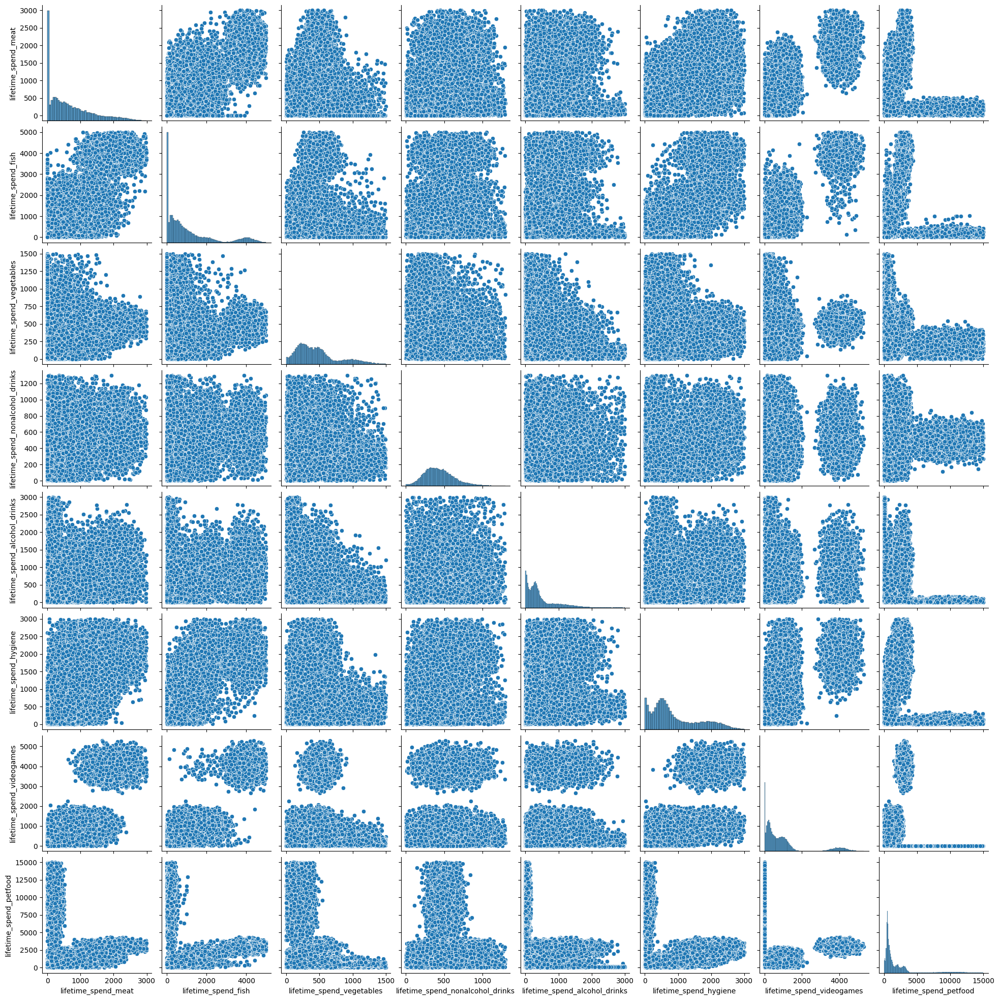

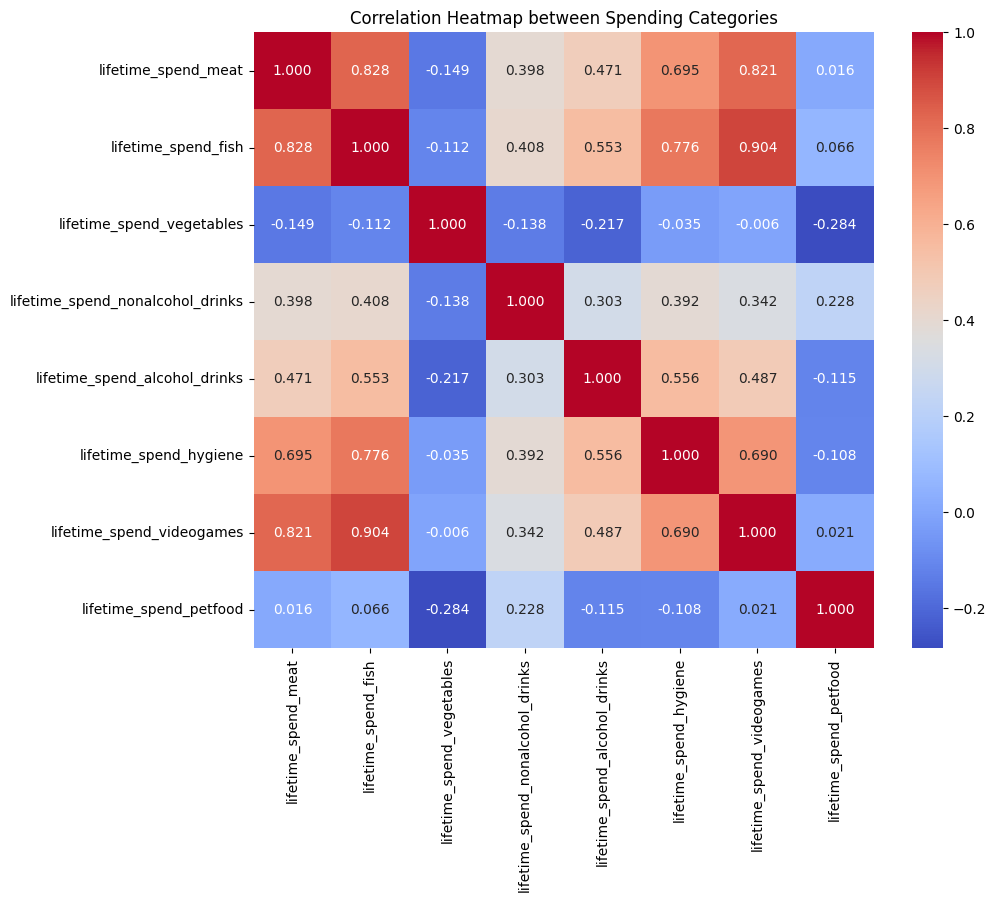

|                                  | lifetime_spend_meat   | lifetime_spend_fish   | lifetime_spend_vegetables   | lifetime_spend_nonalcohol_drinks   | lifetime_spend_alcohol_drinks   | lifetime_spend_hygiene   | lifetime_spend_videogames   | lifetime_spend_petfood   |
|:---------------------------------|:----------------------|:----------------------|:----------------------------|:-----------------------------------|:--------------------------------|:-------------------------|:----------------------------|:-------------------------|
| lifetime_spend_meat              | 1                     | 0.828                 | -0.149                      | 0.398                              | 0.471                           | 0.695                    | 0.821                       | 0.016                    |
| lifetime_spend_fish              | 0.828                 | 1                     | -0.112                      | 0.408                              | 0.553                           | 0.77

In [81]:
# Filter the dataframe to the specified categories
filtered_df = customer_info_precleaned[categories]

# Calculate the correlation matrix for the filtered dataframe
correlation_matrix = filtered_df.corr()

# Create a pairplot using seaborn with the filtered dataframe
sns.pairplot(filtered_df)

# Display the correlation matrix as a heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".3f")
plt.title('Correlation Heatmap between Spending Categories')
plt.show()

# Print the correlation matrix rounded to 3 decimal places
print(correlation_matrix.round(3).to_markdown(numalign="left", stralign="left"))

In [82]:
# Save the DataFrame to a CSV file for later use
customer_info_precleaned.to_csv('customer_info_precleaned.csv')

In [83]:
# For the dataset with the new variables:

# Columns to drop
drop_columns = ['customer_name', 'customer_gender', 'loyalty_card_number', 'latitude', 'longitude', 'degree']

# DataFrame with only the columns to drop and the index column
columns_to_save = customer_info_precleaned[drop_columns]
columns_to_save['customer_id'] = customer_info_precleaned.index

# Save the DataFrame to a CSV file
columns_to_save.to_csv('dropped_columns.csv', index=False)

# Drop the columns from the original DataFrame
customer_info_final = customer_info_precleaned.drop(drop_columns, axis=1)

# Reset the index of the final DataFrame
customer_info_final = customer_info_final.reset_index(drop=True)

# Save the final DataFrame to a CSV file
customer_info_final.to_csv('custumer_info_final_with_%.csv')

In [84]:
# For the dataset with only the original variables:

# Percentage columns
percentage_columns = ['percentage_lifetime_spend_groceries','percentage_lifetime_spend_electronics',
                      'percentage_lifetime_spend_fish','percentage_lifetime_spend_vegetables',
                      'percentage_lifetime_spend_nonalcohol_drinks','percentage_lifetime_spend_alcohol_drinks',
                      'percentage_lifetime_spend_meat', 'percentage_lifetime_spend_hygiene',
                      'percentage_lifetime_spend_videogames','percentage_lifetime_spend_petfood']

# Drop the columns from the customer_info_final
customer_info_final_without = customer_info_final.drop(percentage_columns, axis=1) 

# Save the final DataFrame to a CSV file
customer_info_final_without.to_csv('customer_info_final_without_%.csv')